In [4]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
%matplotlib inline 
import seaborn as sns
import datetime as dt
import scipy.stats as stats

In [5]:
## Loading the required libraries:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns
import datetime as dt
import calendar
from scipy.stats import skew,kurtosis

import warnings
warnings.filterwarnings('ignore')

In [6]:
# Reading data:
olist_customers = pd.read_csv("./dataset/olist_customers_dataset.csv")
olist_geoloc = pd.read_csv("./dataset/olist_geolocation_dataset.csv")
olist_items = pd.read_csv("./dataset/olist_order_items_dataset.csv")
olist_payments = pd.read_csv("./dataset/olist_order_payments_dataset.csv")
olist_reviews = pd.read_csv("./dataset/olist_order_reviews_dataset.csv")
olist_orders = pd.read_csv("./dataset/olist_orders_dataset.csv")
olist_products = pd.read_csv("./dataset/olist_products_dataset.csv")
olist_sellers = pd.read_csv("./dataset/olist_sellers_dataset.csv")
olist_products_name_translation = pd.read_csv("./dataset/product_category_name_translation.csv")

In [7]:
df_merge= pd.merge(olist_customers, olist_orders, on="customer_id")
df_merge= df_merge.merge(olist_reviews, on="order_id")
df_merge= df_merge.merge(olist_items, on="order_id")
df_merge= df_merge.merge(olist_products, on="product_id")
df_merge= df_merge.merge(olist_payments, on="order_id")
df_merge= df_merge.merge(olist_sellers, on='seller_id')
df_merge= df_merge.merge(olist_products_name_translation, on='product_category_name')
df_merge.shape

(115609, 40)

In [8]:
# customer_id 'SP' 경우만 필터링 

df_merge_sp = df_merge[df_merge['customer_state']=='SP']

In [9]:
df_merge_sp.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,...,product_height_cm,product_width_cm,payment_sequential,payment_type,payment_installments,payment_value,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,64.0,31.0,1,credit_card,2,146.87,8577,itaquaquecetuba,SP,office_furniture
22,8bf4f9552bc2db14d6195bbbb5131941,b428f59c73c1bbeb3584744b4570654b,3728,sao paulo,SP,7ebc5c60f532934ce55b3025203ebe5b,delivered,2017-06-24 08:59:47,2017-06-27 03:45:30,2017-06-29 17:37:56,...,64.0,31.0,1,boleto,1,148.45,8577,itaquaquecetuba,SP,office_furniture
33,9202f01b2ebd095e340abd57e02b65e6,7fcf7dc77013a88b9eef97c288b3eb8d,11701,praia grande,SP,4819cd593b17ce6f5757d395b2597a9d,delivered,2017-06-02 11:06:09,2017-06-02 11:23:00,2017-06-08 14:58:56,...,64.0,31.0,1,credit_card,5,143.58,8577,itaquaquecetuba,SP,office_furniture
36,15359860c7341b2f6b12259d83c2e697,52d8a619dff23c2985434b25e9862ff8,18609,botucatu,SP,cec04b13070b06e2f7326de94287d60d,delivered,2017-04-24 12:16:12,2017-04-25 06:35:40,2017-05-15 15:45:56,...,64.0,31.0,1,boleto,1,136.47,8577,itaquaquecetuba,SP,office_furniture
40,645d4fd3f4546d7c9592576665711186,661ada8f1f0f348790c6b9ce57d51f55,17521,marilia,SP,6b5c76c2c9615b42e0c2b7efb11b60d7,delivered,2018-04-03 21:24:29,2018-04-03 21:35:21,2018-04-17 22:38:18,...,64.0,31.0,1,credit_card,2,140.53,8577,itaquaquecetuba,SP,office_furniture


In [10]:
time_columns= ['order_purchase_timestamp', 'order_approved_at','order_delivered_carrier_date','order_delivered_customer_date',
               'order_estimated_delivery_date', 'review_creation_date', 'review_answer_timestamp', 'shipping_limit_date']

In [11]:
df_merge_sp[time_columns]=df_merge_sp[time_columns].apply(pd.to_datetime)

In [12]:
#  order_purchase_timestamp 년, 월, 주, 일, 시간 으로 나누기

# df_merge_sp['weekdaay']=df_merge_sp['order_purchase_timestamp'].dt.weekday_name
df_merge_sp['year']=df_merge_sp['order_purchase_timestamp'].dt.year
df_merge_sp['monthday']=df_merge_sp['order_purchase_timestamp'].dt.day
df_merge_sp['weekday'] = df_merge_sp['order_purchase_timestamp'].dt.weekday
df_merge_sp['month']=df_merge_sp['order_purchase_timestamp'].dt.month
df_merge_sp['hour']=df_merge_sp['order_purchase_timestamp'].dt.hour

In [13]:
# total_price 열 생성 

df_merge_sp['total_price'] = df_merge_sp['price'] + df_merge_sp['freight_value']

In [14]:
df_merge_sp.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 48797 entries, 0 to 115606
Data columns (total 46 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   customer_id                    48797 non-null  object        
 1   customer_unique_id             48797 non-null  object        
 2   customer_zip_code_prefix       48797 non-null  int64         
 3   customer_city                  48797 non-null  object        
 4   customer_state                 48797 non-null  object        
 5   order_id                       48797 non-null  object        
 6   order_status                   48797 non-null  object        
 7   order_purchase_timestamp       48797 non-null  datetime64[ns]
 8   order_approved_at              48793 non-null  datetime64[ns]
 9   order_delivered_carrier_date   48169 non-null  datetime64[ns]
 10  order_delivered_customer_date  47817 non-null  datetime64[ns]
 11  order_estimate

# 고객 Segmentation 방법 1

# Recency

### Order 일자 Recency(최근일)를 기준으로 등급화

 - 고객의 마지막 구매가 얼마나 최근이었는지 
 - 최근에 구매한 고객은 여전히 제품을 염두에 두고 제품을 다시 구매할 가능성이 큼

In [15]:
# recency
recency_df= pd.DataFrame(df_merge_sp.groupby(by=['customer_unique_id'], as_index=False)['order_purchase_timestamp'].max())
recency_df

,customer_unique_id,order_purchase_timestamp
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27
2,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42
3,0004bd2a26a76fe21f786e4fbd80607f,2018-04-05 19:33:16
4,00050ab1314c0e55a6ca13cf7181fecf,2018-04-20 12:57:23
...,...,...
39187,ffedff0547d809c90c05c2691c51f9b7,2017-03-30 14:50:26
39188,ffee94d548cef05b146d825a7648dab4,2018-07-27 22:40:35
39189,fff22793223fe80c97a8fd02ac5c6295,2018-06-26 11:01:47
39190,fff699c184bcc967d62fa2c6171765f7,2017-09-01 17:06:54


### 주문 일자의 가장 마지막 일자 기준 + 2일을 분석하는 Today 당일로 설정 
- df_merge['order_purchase_timestamp'].max() + dt.timedelta(days=2)

In [16]:
from datetime import datetime
today = df_merge_sp['order_purchase_timestamp'].max() + dt.timedelta(days=2)
today = '2018-08-29'
date_today = datetime.strptime(today, '%Y-%m-%d')
date_today

datetime.datetime(2018, 8, 29, 0, 0)

### Today - 주문 일자 산출 과정통해서 두 변수의 차이 계산

In [17]:
recency_df['Recency']= recency_df['order_purchase_timestamp'].apply(lambda x: (date_today - x).days)
recency_df

,customer_unique_id,order_purchase_timestamp,Recency
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,110
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,113
2,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,287
3,0004bd2a26a76fe21f786e4fbd80607f,2018-04-05 19:33:16,145
4,00050ab1314c0e55a6ca13cf7181fecf,2018-04-20 12:57:23,130
...,...,...,...
39187,ffedff0547d809c90c05c2691c51f9b7,2017-03-30 14:50:26,516
39188,ffee94d548cef05b146d825a7648dab4,2018-07-27 22:40:35,32
39189,fff22793223fe80c97a8fd02ac5c6295,2018-06-26 11:01:47,63
39190,fff699c184bcc967d62fa2c6171765f7,2017-09-01 17:06:54,361


In [18]:
df_merge_sp_merged = df_merge_sp.merge(recency_df, on = 'customer_unique_id')
df_merge_sp_merged

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp_x,order_approved_at,order_delivered_carrier_date,...,seller_state,product_category_name_english,year,monthday,weekday,month,hour,total_price,order_purchase_timestamp_y,Recency
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,...,SP,office_furniture,2017,16,1,5,15,146.87,2017-05-16 15:05:35,469
1,8bf4f9552bc2db14d6195bbbb5131941,b428f59c73c1bbeb3584744b4570654b,3728,sao paulo,SP,7ebc5c60f532934ce55b3025203ebe5b,delivered,2017-06-24 08:59:47,2017-06-27 03:45:30,2017-06-29 17:37:56,...,SP,office_furniture,2017,24,5,6,8,148.45,2017-06-24 08:59:47,430
2,9202f01b2ebd095e340abd57e02b65e6,7fcf7dc77013a88b9eef97c288b3eb8d,11701,praia grande,SP,4819cd593b17ce6f5757d395b2597a9d,delivered,2017-06-02 11:06:09,2017-06-02 11:23:00,2017-06-08 14:58:56,...,SP,office_furniture,2017,2,4,6,11,143.58,2017-06-02 11:06:09,452
3,15359860c7341b2f6b12259d83c2e697,52d8a619dff23c2985434b25e9862ff8,18609,botucatu,SP,cec04b13070b06e2f7326de94287d60d,delivered,2017-04-24 12:16:12,2017-04-25 06:35:40,2017-05-15 15:45:56,...,SP,office_furniture,2017,24,0,4,12,136.47,2017-04-24 12:16:12,491
4,645d4fd3f4546d7c9592576665711186,661ada8f1f0f348790c6b9ce57d51f55,17521,marilia,SP,6b5c76c2c9615b42e0c2b7efb11b60d7,delivered,2018-04-03 21:24:29,2018-04-03 21:35:21,2018-04-17 22:38:18,...,SP,office_furniture,2018,3,1,4,21,140.53,2018-04-03 21:24:29,147
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
48792,9d9cfbce48737214f23bf294daf3c6f7,6c861f46d09c560422f6ba6b33c017fe,9371,maua,SP,30b0ea32347476f4b427daf62e09a5bb,delivered,2017-08-12 19:20:39,2017-08-12 19:30:17,2017-08-14 18:26:28,...,SC,la_cuisine,2017,12,5,8,19,213.06,2017-08-12 19:20:39,381
48793,dd3926dff45a3459c4bdac0b58a2a0bf,923bbadc05e0de833a6ea5e3d546c4d0,5727,sao paulo,SP,3821dc9ac1b25bed42324d0885b0a930,delivered,2018-04-17 21:01:58,2018-04-17 21:15:10,2018-04-18 18:52:45,...,SC,la_cuisine,2018,17,1,4,21,167.06,2018-04-17 21:01:58,133
48794,dd3926dff45a3459c4bdac0b58a2a0bf,923bbadc05e0de833a6ea5e3d546c4d0,5727,sao paulo,SP,3821dc9ac1b25bed42324d0885b0a930,delivered,2018-04-17 21:01:58,2018-04-17 21:15:10,2018-04-18 18:52:45,...,SC,la_cuisine,2018,17,1,4,21,167.06,2018-04-17 21:01:58,133
48795,406c8e1382162dc6bef214e0c01fc297,9b8844d7cceb1277e6508cce966e4a09,6767,taboao da serra,SP,4cbf1cc60a2d1704a70e11ee8be1510a,delivered,2018-01-01 17:03:13,2018-01-01 17:11:48,2018-01-02 15:58:13,...,SC,la_cuisine,2018,1,0,1,17,130.03,2018-01-01 17:03:13,239


# Frequency

In [19]:
frequency_df = pd.DataFrame(df_merge_sp.groupby(["customer_unique_id"]).agg({"order_id":"nunique"}).reset_index())
frequency_df.rename(columns={"order_id":"Frequency"}, inplace=True)
frequency_df

,customer_unique_id,Frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0004aac84e0df4da2b147fca70cf8255,1
3,0004bd2a26a76fe21f786e4fbd80607f,1
4,00050ab1314c0e55a6ca13cf7181fecf,1
...,...,...
39187,ffedff0547d809c90c05c2691c51f9b7,1
39188,ffee94d548cef05b146d825a7648dab4,1
39189,fff22793223fe80c97a8fd02ac5c6295,1
39190,fff699c184bcc967d62fa2c6171765f7,1


In [20]:
frequency_df['Frequency'].value_counts()

1     37977
2      1126
3        74
4         7
5         4
9         1
6         1
7         1
15        1
Name: Frequency, dtype: int64

In [21]:
# # Outliers 확인 

# sns.boxplot(frequency_df['Frequency'])

# Monetary

In [22]:
monetary_df = df_merge_sp.groupby('customer_unique_id', as_index=False)['total_price'].sum()
monetary_df.columns = ['customer_unique_id', 'Monetary']
monetary_df

,customer_unique_id,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0004aac84e0df4da2b147fca70cf8255,196.89
3,0004bd2a26a76fe21f786e4fbd80607f,166.98
4,00050ab1314c0e55a6ca13cf7181fecf,35.38
...,...,...
39187,ffedff0547d809c90c05c2691c51f9b7,32.42
39188,ffee94d548cef05b146d825a7648dab4,35.36
39189,fff22793223fe80c97a8fd02ac5c6295,89.19
39190,fff699c184bcc967d62fa2c6171765f7,55.00


In [23]:
# # Outliers 확인 

# sns.boxplot(monetary_df['Monetary'])

In [24]:
# Frequency 와 Monetary에 이상치 확인하여 이상치 제거 

# monetary
# MQ1 = monetary_df.Monetary.quantile(0.05)
# MQ3 = monetary_df.Monetary.quantile(0.95)
# MIQR = MQ3 - MQ1
# monetary_df = monetary_df[(monetary_df.Monetary >= MQ1 - 1.5*MIQR) & (monetary_df.Monetary <= MQ3 + 1.5*MIQR)]

# # frequency
# FQ1 = frequency_df.Frequency.quantile(0.05)
# FQ3 = frequency_df.Frequency.quantile(0.95)
# FIQR = FQ3 - FQ1
# frequency_df = frequency_df[(frequency_df.Frequency >= FQ1 - 1.5*FIQR) & (frequency_df.Frequency <= FQ3 + 1.5*FIQR)]

<AxesSubplot: >

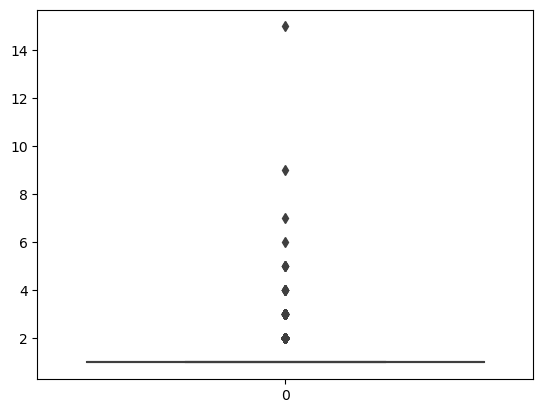

In [25]:
sns.boxplot(frequency_df['Frequency'])

<AxesSubplot: >

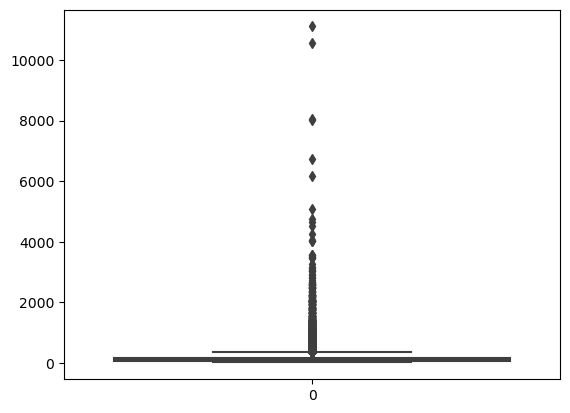

In [26]:
sns.boxplot(monetary_df['Monetary'])

In [27]:
rfm_first = recency_df.merge(frequency_df, on='customer_unique_id')
rfm_final = rfm_first.merge(monetary_df, on='customer_unique_id')
rfm_final

,customer_unique_id,order_purchase_timestamp,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,110,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,113,1,27.19
2,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,287,1,196.89
3,0004bd2a26a76fe21f786e4fbd80607f,2018-04-05 19:33:16,145,1,166.98
4,00050ab1314c0e55a6ca13cf7181fecf,2018-04-20 12:57:23,130,1,35.38
...,...,...,...,...,...
39187,ffedff0547d809c90c05c2691c51f9b7,2017-03-30 14:50:26,516,1,32.42
39188,ffee94d548cef05b146d825a7648dab4,2018-07-27 22:40:35,32,1,35.36
39189,fff22793223fe80c97a8fd02ac5c6295,2018-06-26 11:01:47,63,1,89.19
39190,fff699c184bcc967d62fa2c6171765f7,2017-09-01 17:06:54,361,1,55.00


In [28]:
rfm_final.describe().T

,count,mean,std,min,25%,50%,75%,max
Recency,39192.0,225.825628,152.352016,-6.00,104.00,203.00,330.00,695.0
Frequency,39192.0,1.034293,0.215729,1.00,1.00,1.00,1.00,15.0
Monetary,39192.0,155.910855,238.717721,10.07,56.78,98.51,171.11,11111.4


In [29]:
rfm_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 39192 entries, 0 to 39191
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   customer_unique_id        39192 non-null  object        
 1   order_purchase_timestamp  39192 non-null  datetime64[ns]
 2   Recency                   39192 non-null  int64         
 3   Frequency                 39192 non-null  int64         
 4   Monetary                  39192 non-null  float64       
dtypes: datetime64[ns](1), float64(1), int64(2), object(1)
memory usage: 1.8+ MB


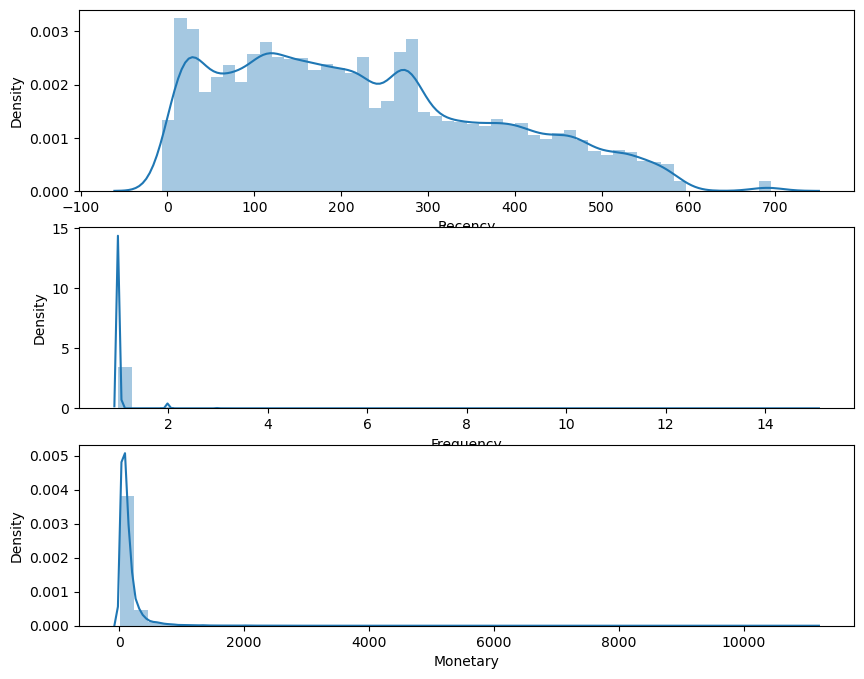

In [30]:
# rfm 시각화 확인하기

plt.figure(figsize=(10,8))
plt.subplot(3,1,1)
sns.distplot(rfm_final['Recency'])
plt.subplot(3,1,2)
sns.distplot(rfm_final['Frequency'])
plt.subplot(3,1,3)
sns.distplot(rfm_final['Monetary'])
plt.show();

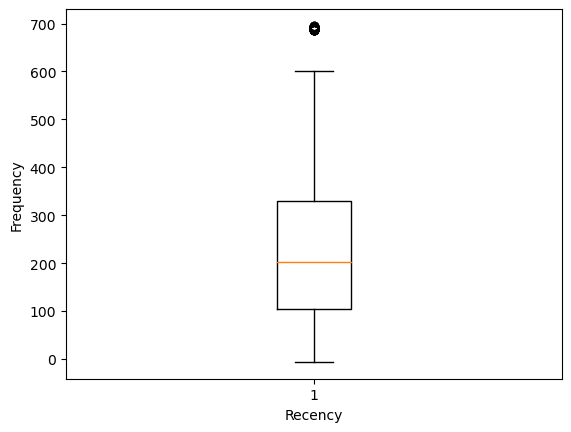

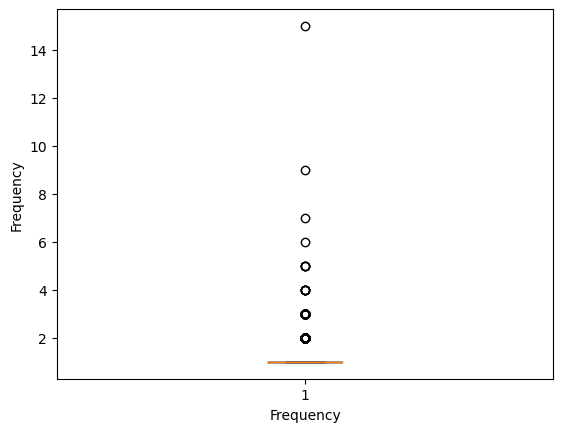

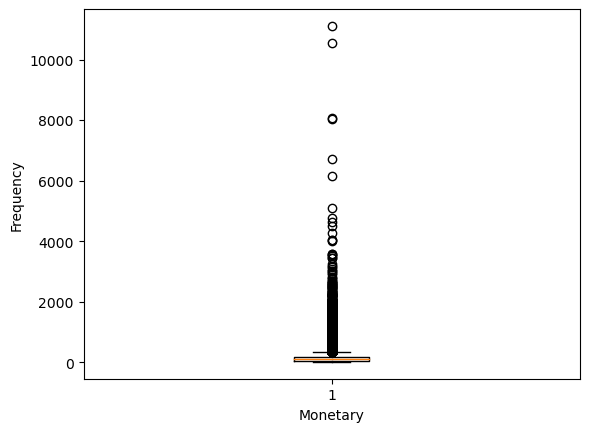

In [31]:
for i in ['Recency', 'Frequency', 'Monetary']:
    plt.figure()
    plt.tight_layout()
    plt.gca().set(xlabel=i, ylabel='Frequency')
    plt.boxplot(rfm_final[i])

### 각 컬럼 outlier 제거하기

In [32]:
def num_outlier(df_in, col_name):
    q1 = df_in[col_name].quantile(0.05)
    q3 = df_in[col_name].quantile(0.95)
    iqr = q3-q1 #Interquartile range
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    outliers_df= df_in.loc[(df_in[col_name] < fence_low) | (df_in[col_name] > fence_high)]
    return print("Number of outliers in {} column: ".format(col_name), len(outliers_df)), print("Indexes: ", outliers_df.index)

In [33]:
for i in ["Recency", "Monetary"]:
    num_outlier(rfm_final, i)
    print("*"*40)

Number of outliers in Recency column:  0
Indexes:  Int64Index([], dtype='int64')
****************************************
Number of outliers in Monetary column:  375
Indexes:  Int64Index([  116,   188,   197,   198,   251,   269,   438,   490,   588,
              781,
            ...
            38265, 38266, 38614, 38907, 38971, 39008, 39041, 39071, 39084,
            39106],
           dtype='int64', length=375)
****************************************


In [34]:
rfm_final.shape

(39192, 5)

In [35]:
def remove_outlier(df_in, col_name):
    q1 = df_in[col_name].quantile(0.05)
    q3 = df_in[col_name].quantile(0.95)
    iqr = q3-q1     
    fence_low  = q1-1.5*iqr
    fence_high = q3+1.5*iqr
    index_outliers= df_in.loc[(df_in[col_name] < fence_low) | (df_in[col_name] > fence_high)].index
    df_in= pd.DataFrame(df_in.drop(index_outliers.to_list(), axis=0, inplace=True))
    print("Outliers in the {} column have been removed".format(col_name))
    return df_in

In [36]:
for i in ["Recency", "Monetary"]:
    remove_outlier(rfm_final, i)
    print("*"*40)

Outliers in the Recency column have been removed
****************************************
Outliers in the Monetary column have been removed
****************************************


In [37]:
rfm_final.shape

(38817, 5)

In [38]:
rfm_final2 = rfm_final.copy()
rfm_final2 = rfm_final2.set_index('customer_unique_id')
rfm_final2

,order_purchase_timestamp,Recency,Frequency,Monetary
customer_unique_id,,,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,110,1,141.90
0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,113,1,27.19
0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,287,1,196.89
0004bd2a26a76fe21f786e4fbd80607f,2018-04-05 19:33:16,145,1,166.98
00050ab1314c0e55a6ca13cf7181fecf,2018-04-20 12:57:23,130,1,35.38
...,...,...,...,...
ffedff0547d809c90c05c2691c51f9b7,2017-03-30 14:50:26,516,1,32.42
ffee94d548cef05b146d825a7648dab4,2018-07-27 22:40:35,32,1,35.36
fff22793223fe80c97a8fd02ac5c6295,2018-06-26 11:01:47,63,1,89.19


### RFM 각 분야 segmentation 진행 

In [39]:
# R, F, M 같은 갯수로 같은 비율  나누기 
# qcut : label 5 등급으로 나누기  

In [40]:
rfm_final2["recency_score"]  = pd.qcut(rfm_final2['Recency'], 5, labels=[5, 4, 3, 2, 1])
rfm_final2["frequency_score"]= pd.qcut(rfm_final2['Frequency'].rank(method="first"), 5, labels=[1, 2, 3, 4, 5])
rfm_final2["monetary_score"] = pd.qcut(rfm_final2['Monetary'], 5, labels=[1, 2, 3, 4, 5])

In [41]:
rfm_final2['rfm_score'] = rfm_final2.recency_score.astype(str)+ rfm_final2.frequency_score.astype(str) + rfm_final2.monetary_score.astype(str)
rfm_final2

,order_purchase_timestamp,Recency,Frequency,Monetary,recency_score,frequency_score,monetary_score,rfm_score
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,110,1,141.90,4,1,4,414
0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,113,1,27.19,4,1,1,411
0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,287,1,196.89,2,1,5,215
0004bd2a26a76fe21f786e4fbd80607f,2018-04-05 19:33:16,145,1,166.98,4,1,4,414
00050ab1314c0e55a6ca13cf7181fecf,2018-04-20 12:57:23,130,1,35.38,4,1,1,411
...,...,...,...,...,...,...,...,...
ffedff0547d809c90c05c2691c51f9b7,2017-03-30 14:50:26,516,1,32.42,1,5,1,151
ffee94d548cef05b146d825a7648dab4,2018-07-27 22:40:35,32,1,35.36,5,5,1,551
fff22793223fe80c97a8fd02ac5c6295,2018-06-26 11:01:47,63,1,89.19,5,5,3,553


In [42]:
# RFM 스코어 가중치 없이 산출 : Recency * 가중치 1 + Frequency * 가중치 1 + Monetary * 가중치 1

# EX) RMF_SCORE : 151 , 553, 252, 552
# 상기 SCORE는 고객 SEGMENTATION 하기 위해 산출한 것 

In [43]:
rfm_final2.info()

<class 'pandas.core.frame.DataFrame'>
Index: 38817 entries, 0000366f3b9a7992bf8c76cfdf3221e2 to fff96bc586f78b1f070da28c4977e810
Data columns (total 8 columns):
 #   Column                    Non-Null Count  Dtype         
---  ------                    --------------  -----         
 0   order_purchase_timestamp  38817 non-null  datetime64[ns]
 1   Recency                   38817 non-null  int64         
 2   Frequency                 38817 non-null  int64         
 3   Monetary                  38817 non-null  float64       
 4   recency_score             38817 non-null  category      
 5   frequency_score           38817 non-null  category      
 6   monetary_score            38817 non-null  category      
 7   rfm_score                 38817 non-null  object        
dtypes: category(3), datetime64[ns](1), float64(1), int64(2), object(1)
memory usage: 1.9+ MB


In [44]:
rfm_final2 = rfm_final2.astype({'recency_score':'int'})
rfm_final2 = rfm_final2.astype({'frequency_score':'int'})
rfm_final2 = rfm_final2.astype({'monetary_score':'int'})

In [45]:
rfm_final2

,order_purchase_timestamp,Recency,Frequency,Monetary,recency_score,frequency_score,monetary_score,rfm_score
customer_unique_id,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,110,1,141.90,4,1,4,414
0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,113,1,27.19,4,1,1,411
0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,287,1,196.89,2,1,5,215
0004bd2a26a76fe21f786e4fbd80607f,2018-04-05 19:33:16,145,1,166.98,4,1,4,414
00050ab1314c0e55a6ca13cf7181fecf,2018-04-20 12:57:23,130,1,35.38,4,1,1,411
...,...,...,...,...,...,...,...,...
ffedff0547d809c90c05c2691c51f9b7,2017-03-30 14:50:26,516,1,32.42,1,5,1,151
ffee94d548cef05b146d825a7648dab4,2018-07-27 22:40:35,32,1,35.36,5,5,1,551
fff22793223fe80c97a8fd02ac5c6295,2018-06-26 11:01:47,63,1,89.19,5,5,3,553


In [46]:
# source from url : https://documentation.bloomreach.com/engagement/docs/rfm-segmentation 

seg_map= {
    r'111|112|121|131|141|151': 'Lost customers',
    r'332|322|233|232|223|222|132|123|122|212|211': 'Hibernating customers', 
    r'155|154|144|214|215|115|114|113': 'Cannot Lose Them',
    r'255|254|245|244|253|252|243|242|235|234|225|224|153|152|145|143|142|135|134|133|125|124': 'At Risk',
    r'331|321|312|221|213|231|241|251': 'About To Sleep',
    r'535|534|443|434|343|334|325|324': 'Need Attention',
    r'525|524|523|522|521|515|514|513|425|424|413|414|415|315|314|313': 'Promising',
    r'512|511|422|421|412|411|311': 'New Customers',
    r'553|551|552|541|542|533|532|531|452|451|442|441|431|453|433|432|423|353|352|351|342|341|333|323': 'Potential Loyalist',
    r'543|444|435|355|354|345|344|335': 'Loyal',
    r'555|554|544|545|454|455|445': 'Champions'
}

In [47]:
rfm_final2['segment'] = rfm_final2['recency_score'].astype(str) + rfm_final2['frequency_score'].astype(str) + rfm_final2['monetary_score'].astype(str)
rfm_final2['segment'] = rfm_final2['segment'].replace(seg_map, regex=True)
rfm_final2.head()

,order_purchase_timestamp,Recency,Frequency,Monetary,recency_score,frequency_score,monetary_score,rfm_score,segment
customer_unique_id,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,110,1,141.90,4,1,4,414,Promising
0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,113,1,27.19,4,1,1,411,New Customers
0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,287,1,196.89,2,1,5,215,Cannot Lose Them
0004bd2a26a76fe21f786e4fbd80607f,2018-04-05 19:33:16,145,1,166.98,4,1,4,414,Promising
00050ab1314c0e55a6ca13cf7181fecf,2018-04-20 12:57:23,130,1,35.38,4,1,1,411,New Customers


In [48]:
rfm_final2['segment'].unique()

array(['Promising', 'New Customers', 'Cannot Lose Them', 'About To Sleep',
       'Lost customers', 'Hibernating customers', 'Champions',
       'Potential Loyalist', 'Loyal', 'At Risk', 'Need Attention'],
      dtype=object)

In [49]:
rfm_final2['segment'].nunique()

11

### 고객 segment 별 R, F, M describe

In [50]:
rfm_stats = rfm_final2[["segment", "Recency", "Frequency", "Monetary"]].groupby("segment").agg(['mean','median', 'min', 'max', 'count'])
rfm_stats

Recency                        Frequency             \
                             mean median  min  max count      mean median min   
segment                                                                         
About To Sleep         262.356032  269.0  162  370  2379  1.000420    1.0   1   
At Risk                373.063827  352.0  254  694  6737  1.039187    1.0   1   
Cannot Lose Them       424.842526  425.0  254  695  2502  1.065148    1.0   1   
Champions               76.158558   75.0   -6  161  2302  1.214162    1.0   1   
Hibernating customers  331.266364  311.0  162  693  3529  1.000000    1.0   1   
Lost customers         466.622591  460.0  371  694  1868  1.001606    1.0   1   
Loyal                  162.805976  178.0   -1  253  2577  1.091191    1.0   1   
Need Attention         145.053930  162.0    0  253  2392  1.000000    1.0   1   
New Customers          109.873395  113.0   -1  253  2259  1.000000    1.0   1   
Potential Loyalist     117.014510  116.0   -1  253  7374  1.017358    1.0   1   
Promising               95.225194   80.0   -1  253  4898  1.000000    1.0   1   

                                   Monetary                                 
                      max count        mean  median     min      max count  
segment                                                                     
About To Sleep          2  2379   46.271782   39.10   10.07   119.32  2379  
At Risk                 3  6737  187.393556  139.17   49.00  1077.41  6737  
Cannot Lose Them        3  2502  222.586487  168.78   79.09  1057.29  2502  
Champions              15  2302  269.305678  209.53  119.37  1050.00  2302  
Hibernating customers   1  3529   70.567098   67.62   11.63   119.34  3529  
Lost customers          2  1868   40.169898   38.21   12.28    78.46  1868  
Loyal                   6  2577  245.468960  189.97   78.60  1068.05  2577  
Need Attention          1  2392  185.358069  147.65   78.62  1039.74  2392  
New Customers           1  2259   46.568676   45.39   13.29    78.44  2259  
Potential Loyalist      3  7374   65.280236   62.69   10.89   119.34  7374  
Promising               1  4898  182.793671  140.03   14.06  1075.74  4898

### OLIST 내 고객 segment 별 비중 확인 ['Ratio'] 

In [51]:
rfm_stats['Ratio']= (100*rfm_stats['Monetary']["count"]/rfm_stats['Monetary']["count"].sum()).round(2)
rfm_stats

Recency                        Frequency             \
                             mean median  min  max count      mean median min   
segment                                                                         
About To Sleep         262.356032  269.0  162  370  2379  1.000420    1.0   1   
At Risk                373.063827  352.0  254  694  6737  1.039187    1.0   1   
Cannot Lose Them       424.842526  425.0  254  695  2502  1.065148    1.0   1   
Champions               76.158558   75.0   -6  161  2302  1.214162    1.0   1   
Hibernating customers  331.266364  311.0  162  693  3529  1.000000    1.0   1   
Lost customers         466.622591  460.0  371  694  1868  1.001606    1.0   1   
Loyal                  162.805976  178.0   -1  253  2577  1.091191    1.0   1   
Need Attention         145.053930  162.0    0  253  2392  1.000000    1.0   1   
New Customers          109.873395  113.0   -1  253  2259  1.000000    1.0   1   
Potential Loyalist     117.014510  116.0   -1  253  7374  1.017358    1.0   1   
Promising               95.225194   80.0   -1  253  4898  1.000000    1.0   1   

                                   Monetary                                 \
                      max count        mean  median     min      max count   
segment                                                                      
About To Sleep          2  2379   46.271782   39.10   10.07   119.32  2379   
At Risk                 3  6737  187.393556  139.17   49.00  1077.41  6737   
Cannot Lose Them        3  2502  222.586487  168.78   79.09  1057.29  2502   
Champions              15  2302  269.305678  209.53  119.37  1050.00  2302   
Hibernating customers   1  3529   70.567098   67.62   11.63   119.34  3529   
Lost customers          2  1868   40.169898   38.21   12.28    78.46  1868   
Loyal                   6  2577  245.468960  189.97   78.60  1068.05  2577   
Need Attention          1  2392  185.358069  147.65   78.62  1039.74  2392   
New Customers           1  2259   46.568676   45.39   13.29    78.44  2259   
Potential Loyalist      3  7374   65.280236   62.69   10.89   119.34  7374   
Promising               1  4898  182.793671  140.03   14.06  1075.74  4898   

                       Ratio  
                              
segment                       
About To Sleep          6.13  
At Risk                17.36  
Cannot Lose Them        6.45  
Champions               5.93  
Hibernating customers   9.09  
Lost customers          4.81  
Loyal                   6.64  
Need Attention          6.16  
New Customers           5.82  
Potential Loyalist     19.00  
Promising              12.62

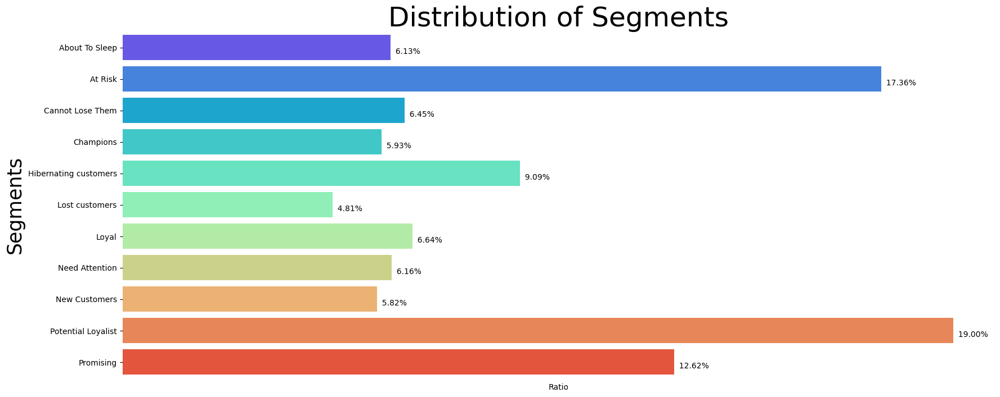

In [53]:
plt.figure(figsize=(20,8))
#plt.rc('font', size=20)
per= sns.barplot(x=rfm_stats['Ratio'], y=rfm_stats.index, data=rfm_stats, palette="rainbow")
sns.despine(bottom = True, left = True)
for i, v in enumerate(rfm_stats['Ratio']):
    per.text(v, i+.20,"  {:.2f}".format(v)+"%", color='black', ha="left")
per.set_ylabel('Segments', fontsize=25)
per.set(xticks=[])
plt.title('Distribution of Segments', fontsize=35)
plt.show()

* About to Sleep : 
* At Risk : 
* Cannot Lose Them : 
* Champions : 
* Hibernating Customers : 
* Loyal : 
* Need Attention : 
* New Customers : 
* Potential Loyalist : 
* Promising : 

In [54]:
!pip install squarify
import squarify

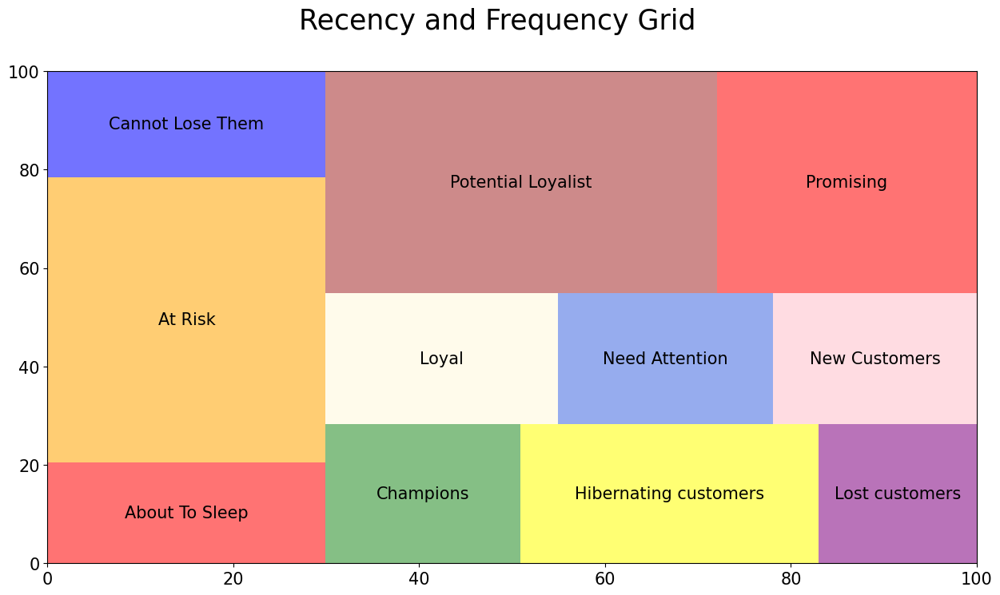

In [55]:
# Treemap by recency/frequency
plt.figure(figsize=(15,8))
plt.rc('font', size=15)
squarify.plot(sizes=rfm_stats["Recency"]["count"], label=rfm_stats.index, 
              color=["red","orange","blue", "forestgreen", "yellow", "purple", "cornsilk","royalblue", "pink", "brown"], alpha=.55)
plt.suptitle("Recency and Frequency Grid", fontsize=25);

# 고객 Segmentation 방법 2

### RFM score 직접 구하기

* RFM score = a * R(Recency) + bF(Frequency) + cM(Monetary)

* a,b,c 최적의 가중치를 직접 구해서 부여된 RFM_SCORE를 구해보자

In [56]:
rfm_final3 = rfm_final2.reset_index()
rfm_final3

,customer_unique_id,order_purchase_timestamp,Recency,Frequency,Monetary,recency_score,frequency_score,monetary_score,rfm_score,segment
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,110,1,141.90,4,1,4,414,Promising
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,113,1,27.19,4,1,1,411,New Customers
2,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,287,1,196.89,2,1,5,215,Cannot Lose Them
3,0004bd2a26a76fe21f786e4fbd80607f,2018-04-05 19:33:16,145,1,166.98,4,1,4,414,Promising
4,00050ab1314c0e55a6ca13cf7181fecf,2018-04-20 12:57:23,130,1,35.38,4,1,1,411,New Customers
...,...,...,...,...,...,...,...,...,...,...
38812,ffedff0547d809c90c05c2691c51f9b7,2017-03-30 14:50:26,516,1,32.42,1,5,1,151,Lost customers
38813,ffee94d548cef05b146d825a7648dab4,2018-07-27 22:40:35,32,1,35.36,5,5,1,551,Potential Loyalist
38814,fff22793223fe80c97a8fd02ac5c6295,2018-06-26 11:01:47,63,1,89.19,5,5,3,553,Potential Loyalist
38815,fff699c184bcc967d62fa2c6171765f7,2017-09-01 17:06:54,361,1,55.00,2,5,2,252,At Risk


In [57]:
rfm_final_scale = rfm_final3[['customer_unique_id', 'Recency', 'Frequency', 'Monetary']]
rfm_final_scale

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,110,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,113,1,27.19
2,0004aac84e0df4da2b147fca70cf8255,287,1,196.89
3,0004bd2a26a76fe21f786e4fbd80607f,145,1,166.98
4,00050ab1314c0e55a6ca13cf7181fecf,130,1,35.38
...,...,...,...,...
38812,ffedff0547d809c90c05c2691c51f9b7,516,1,32.42
38813,ffee94d548cef05b146d825a7648dab4,32,1,35.36
38814,fff22793223fe80c97a8fd02ac5c6295,63,1,89.19
38815,fff699c184bcc967d62fa2c6171765f7,361,1,55.00


In [58]:
# rfm_final_scale = rfm_final_scale.set_index('order_purchase_timestamp')

In [59]:
# del rfm_final_scale['index'] 
del rfm_final_scale['customer_unique_id'] 

### MinmaxScaler로 R, F, M Normalization 

In [60]:
from sklearn.preprocessing import MinMaxScaler
scaler= MinMaxScaler()

rfm_final_scaled= scaler.fit_transform(rfm_final_scale)
rfm_final_scaled_df= pd.DataFrame(rfm_final_scaled)
rfm_final_scaled_df.columns = ['recency', 'frequency', 'monetary']
rfm_final_scaled_df

,recency,frequency,monetary
0,0.165478,0.0,0.123513
1,0.169757,0.0,0.016040
2,0.417974,0.0,0.175033
3,0.215407,0.0,0.147010
4,0.194009,0.0,0.023713
...,...,...,...
38812,0.744650,0.0,0.020940
38813,0.054208,0.0,0.023694
38814,0.098431,0.0,0.074128
38815,0.523538,0.0,0.042095


### Normalization 된 r,f,m 데이터들을 가지고 군집화 모델링 

- k-means 사용 
- clustering 나누는 기준 KElbowVIsualizer 통해 확인  (6집단으로 확인)
- clustering 나누는 기준 평가 지표 Silhouette score 확인

In [64]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer

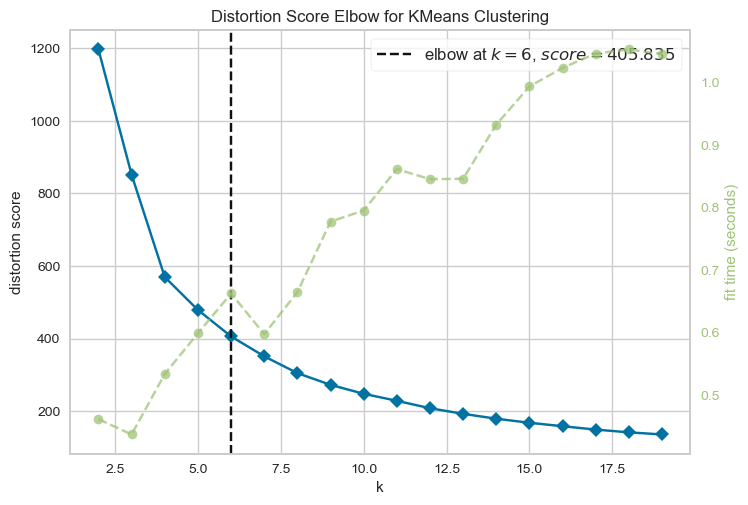

<AxesSubplot: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [65]:
k_means = KMeans(n_clusters=5, max_iter=50)
elbow = KElbowVisualizer(k_means, k=(2, 20))
elbow.fit(rfm_final_scaled_df)
elbow.show()

In [68]:
centers = kmeans.cluster_centers_
centers

array([[0.45445664, 0.00183192, 0.0954225 ],
       [0.26796119, 0.00139204, 0.07834958],
       [0.09103199, 0.0015862 , 0.0809628 ],
       [0.37346395, 0.01055626, 0.65106318],
       [0.69374403, 0.00167797, 0.10779956],
       [0.19967748, 0.00832298, 0.31282823]])

In [67]:
kmeans= KMeans(n_clusters=elbow.elbow_value_)
kmeans.fit(rfm_final_scaled_df)

KMeans(n_clusters=6)

In [69]:
# clustering label 부여하기 

rfm_final_scaled_df['Cluster']= kmeans.labels_
rfm_final_scaled_df = rfm_final_scaled_df.reset_index()
rfm_final_scaled_df

,index,recency,frequency,monetary,Cluster
0,0,0.165478,0.0,0.123513,2
1,1,0.169757,0.0,0.016040,2
2,2,0.417974,0.0,0.175033,0
3,3,0.215407,0.0,0.147010,1
4,4,0.194009,0.0,0.023713,1
...,...,...,...,...,...
38812,38812,0.744650,0.0,0.020940,4
38813,38813,0.054208,0.0,0.023694,2
38814,38814,0.098431,0.0,0.074128,2
38815,38815,0.523538,0.0,0.042095,0


In [77]:
rfm_final_scaled_df['Segment'] = rfm_final_scaled_df['Cluster']

In [78]:
rfm_final_scaled_df.head()

,index,recency,frequency,monetary,Cluster,Segment
0,0,0.165478,0.0,0.123513,2,2
1,1,0.169757,0.0,0.016040,2,2
2,2,0.417974,0.0,0.175033,0,0
3,3,0.215407,0.0,0.147010,1,1
4,4,0.194009,0.0,0.023713,1,1


In [79]:
rfm_final_scaled_df.replace({'Segment': {0 : 'Bronze', 1:'Silver', 2:'Gold', 3:'Royal', 4:'Vip', 5:'VVip'}}, inplace=True)
rfm_final_scaled_df

,index,recency,frequency,monetary,Cluster,Segment
0,0,0.165478,0.0,0.123513,2,Gold
1,1,0.169757,0.0,0.016040,2,Gold
2,2,0.417974,0.0,0.175033,0,Bronze
3,3,0.215407,0.0,0.147010,1,Silver
4,4,0.194009,0.0,0.023713,1,Silver
...,...,...,...,...,...,...
38812,38812,0.744650,0.0,0.020940,4,Vip
38813,38813,0.054208,0.0,0.023694,2,Gold
38814,38814,0.098431,0.0,0.074128,2,Gold
38815,38815,0.523538,0.0,0.042095,0,Bronze


### Silhouette score

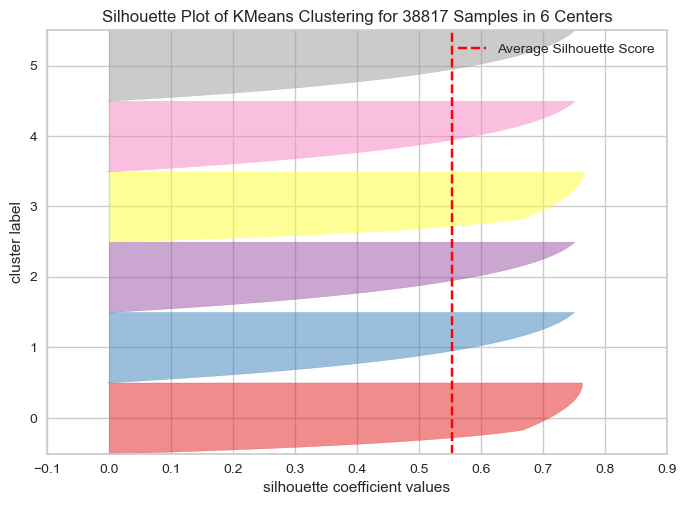

<AxesSubplot: title={'center': 'Silhouette Plot of KMeans Clustering for 38817 Samples in 6 Centers'}, xlabel='silhouette coefficient values', ylabel='cluster label'>

In [136]:
from yellowbrick.cluster import SilhouetteVisualizer

vis=SilhouetteVisualizer(KMeans(n_clusters=6,n_init=5, random_state=1))
vis.fit(rfm_final_scaled_df)
vis.show()

#### 각 집단의 silhouette values 가 1에 가까우면 적절한 군집화가 되었다는 의미 

In [80]:
rfm_final_scale = rfm_final_scale.reset_index()
rfm_final_scale

,index,Recency,Frequency,Monetary
0,0,110,1,141.90
1,1,113,1,27.19
2,2,287,1,196.89
3,3,145,1,166.98
4,4,130,1,35.38
...,...,...,...,...
38812,38812,516,1,32.42
38813,38813,32,1,35.36
38814,38814,63,1,89.19
38815,38815,361,1,55.00


In [81]:
rfm_final_scaled_df['Cluster'].value_counts()

2    10090
1     9701
0     8811
4     6220
5     2867
3     1128
Name: Cluster, dtype: int64

In [82]:
rfm_final_scaled_df_pivot = rfm_final_scaled_df.pivot_table(index='Cluster', values=['recency', 'frequency', 'monetary'], aggfunc=['mean', 'std'])
rfm_final_scaled_df_pivot

mean                           std                    
        frequency  monetary   recency frequency  monetary   recency
Cluster                                                            
0        0.001824  0.095335  0.454348  0.011820  0.070003  0.061568
1        0.001392  0.078408  0.267848  0.010136  0.049817  0.051077
2        0.001586  0.081069  0.090988  0.010902  0.052601  0.051233
3        0.010575  0.651381  0.373584  0.044135  0.143291  0.202964
4        0.001677  0.107846  0.693645  0.010966  0.089523  0.084842
5        0.008371  0.313305  0.200107  0.026772  0.086587  0.104694

In [83]:
rfm_pd_merged = pd.merge(rfm_final_scale,rfm_final_scaled_df, on='index')
rfm_pd_merged

,index,Recency,Frequency,Monetary,recency,frequency,monetary,Cluster,Segment
0,0,110,1,141.90,0.165478,0.0,0.123513,2,Gold
1,1,113,1,27.19,0.169757,0.0,0.016040,2,Gold
2,2,287,1,196.89,0.417974,0.0,0.175033,0,Bronze
3,3,145,1,166.98,0.215407,0.0,0.147010,1,Silver
4,4,130,1,35.38,0.194009,0.0,0.023713,1,Silver
...,...,...,...,...,...,...,...,...,...
38812,38812,516,1,32.42,0.744650,0.0,0.020940,4,Vip
38813,38813,32,1,35.36,0.054208,0.0,0.023694,2,Gold
38814,38814,63,1,89.19,0.098431,0.0,0.074128,2,Gold
38815,38815,361,1,55.00,0.523538,0.0,0.042095,0,Bronze


In [84]:
rfm_pd_merged_index = rfm_pd_merged.pivot_table(index='Cluster', values=['Recency', 'Frequency', 'Monetary'], aggfunc=['mean', 'std'])
rfm_pd_merged_index = rfm_pd_merged_index.reset_index()

In [85]:
rfm_pd_merged_index

Cluster      mean                               std                        
          Frequency    Monetary     Recency Frequency    Monetary     Recency
0       0  1.025536  111.824987  312.498241  0.165482   74.716762   43.159024
1       1  1.019483   93.758505  181.761262  0.141901   53.171442   35.804951
2       2  1.022200   96.598057   57.782458  0.152628   56.142784   35.914287
3       3  1.148050  705.315381  255.882092  0.617890  152.940429  142.277904
4       4  1.023473  125.178003  480.245338  0.153521   95.551410   59.474492
5       5  1.117196  344.472494  134.275201  0.374810   92.417267   73.390218

In [86]:
rfm_index = rfm_pd_merged.pivot_table(index='Cluster', values=['recency', 'frequency', 'monetary'], aggfunc=['mean', 'std'])
rfm_index

mean                           std                    
        frequency  monetary   recency frequency  monetary   recency
Cluster                                                            
0        0.001824  0.095335  0.454348  0.011820  0.070003  0.061568
1        0.001392  0.078408  0.267848  0.010136  0.049817  0.051077
2        0.001586  0.081069  0.090988  0.010902  0.052601  0.051233
3        0.010575  0.651381  0.373584  0.044135  0.143291  0.202964
4        0.001677  0.107846  0.693645  0.010966  0.089523  0.084842
5        0.008371  0.313305  0.200107  0.026772  0.086587  0.104694

- K개로 분류된 각 그룹별로 R, F, M의 표준편차를 평균으로 나누어 CV를 산출하고 
CV를 최소로하는 CVrn, CVfn, CVmn을 찾아 전체 CV의 합으로 다시 나누어 w1, w2, w3를 구하고 
모든 가중치의 합을 1로 만들기 위해 w1, w2, w3 각각을 3개를 모두 더한 값으로 나누어 W1, W2, W3를 구하여 최종 가중치로 결정하였다.

In [87]:
rfm_index = rfm_index.reset_index()
rfm_index

Cluster      mean                           std                    
          frequency  monetary   recency frequency  monetary   recency
0       0  0.001824  0.095335  0.454348  0.011820  0.070003  0.061568
1       1  0.001392  0.078408  0.267848  0.010136  0.049817  0.051077
2       2  0.001586  0.081069  0.090988  0.010902  0.052601  0.051233
3       3  0.010575  0.651381  0.373584  0.044135  0.143291  0.202964
4       4  0.001677  0.107846  0.693645  0.010966  0.089523  0.084842
5       5  0.008371  0.313305  0.200107  0.026772  0.086587  0.104694

In [88]:
rfm_pd_merged_index

Cluster      mean                               std                        
          Frequency    Monetary     Recency Frequency    Monetary     Recency
0       0  1.025536  111.824987  312.498241  0.165482   74.716762   43.159024
1       1  1.019483   93.758505  181.761262  0.141901   53.171442   35.804951
2       2  1.022200   96.598057   57.782458  0.152628   56.142784   35.914287
3       3  1.148050  705.315381  255.882092  0.617890  152.940429  142.277904
4       4  1.023473  125.178003  480.245338  0.153521   95.551410   59.474492
5       5  1.117196  344.472494  134.275201  0.374810   92.417267   73.390218

In [89]:
rfm_index.iloc[:,4]

0    0.011820
1    0.010136
2    0.010902
3    0.044135
4    0.010966
5    0.026772
Name: (std, frequency), dtype: float64


K개로 분류된 각 그룹별로 R, F, M의 표준편차를 평균으로 나누어 CV(변동계수) -> [표준편차] / [평균] 를 산출

In [90]:
rfm_pd_merged_index['frequency_cv'] =  rfm_pd_merged_index.iloc[:,4] / rfm_pd_merged_index.iloc[:,1]
rfm_pd_merged_index['monetary_cv'] = rfm_pd_merged_index.iloc[:, 5] / rfm_pd_merged_index.iloc[:, 2] 
rfm_pd_merged_index['recency_cv'] = rfm_pd_merged_index.iloc[:, 6] / rfm_pd_merged_index.iloc[:, 3]
rfm_pd_merged_index

Cluster      mean                               std                          \
          Frequency    Monetary     Recency Frequency    Monetary     Recency   
0       0  1.025536  111.824987  312.498241  0.165482   74.716762   43.159024   
1       1  1.019483   93.758505  181.761262  0.141901   53.171442   35.804951   
2       2  1.022200   96.598057   57.782458  0.152628   56.142784   35.914287   
3       3  1.148050  705.315381  255.882092  0.617890  152.940429  142.277904   
4       4  1.023473  125.178003  480.245338  0.153521   95.551410   59.474492   
5       5  1.117196  344.472494  134.275201  0.374810   92.417267   73.390218   

  frequency_cv monetary_cv recency_cv  
                                       
0     0.161361    0.668158   0.138110  
1     0.139189    0.567111   0.196989  
2     0.149313    0.581200   0.621543  
3     0.538209    0.216840   0.556029  
4     0.150000    0.763324   0.123842  
5     0.335492    0.268286   0.546566

CV를 최소로하는 CVrn, CVfn, CVmn 산출

In [91]:
CVrn = rfm_pd_merged_index.iloc[:, 9].min()
CVfn = rfm_pd_merged_index.iloc[:, 7].min()
CVmn = rfm_pd_merged_index.iloc[:, 8].min()

전체 CV의 합으로 다시 나누어 w1, w2, w3를 구하기

In [92]:
wr = CVrn / rfm_pd_merged_index['recency_cv'].sum()
wf = CVfn / rfm_pd_merged_index['frequency_cv'].sum()
wm = CVmn / rfm_pd_merged_index['monetary_cv'].sum()

wr, wf, wm

(0.05672810246854924, 0.09445748293148083, 0.07074894269471818)

모든 가중치의 합을 1로 만들기 위해 w1, w2, w3
각각을 3개를 모두 더한 값으로 나누어 W1, W2, W3를 구하여 최종 가중치로 결정

In [93]:
WR = wr / (wr + wf + wm)  
WF = wf / (wr + wf + wm)  
WM = wm / (wr + wf + wm)  

WR, WF, WM

(0.2556073764436099, 0.4256096775133388, 0.3187829460430513)

In [94]:
rfm_pd_merged['RFM_SCORE'] = WR * rfm_pd_merged['Recency'] + WF * rfm_pd_merged['Frequency'] + WM * rfm_pd_merged['Monetary']

In [95]:
rfm_pd_merged

,index,Recency,Frequency,Monetary,recency,frequency,monetary,Cluster,Segment,RFM_SCORE
0,0,110,1,141.90,0.165478,0.0,0.123513,2,Gold,73.777721
1,1,113,1,27.19,0.169757,0.0,0.016040,2,Gold,37.976952
2,2,287,1,196.89,0.417974,0.0,0.175033,0,Bronze,136.550101
3,3,145,1,166.98,0.215407,0.0,0.147010,1,Silver,90.719056
4,4,130,1,35.38,0.194009,0.0,0.023713,1,Silver,44.933109
...,...,...,...,...,...,...,...,...,...,...
38812,38812,516,1,32.42,0.744650,0.0,0.020940,4,Vip,142.653959
38813,38813,32,1,35.36,0.054208,0.0,0.023694,2,Gold,19.877211
38814,38814,63,1,89.19,0.098431,0.0,0.074128,2,Gold,44.961125
38815,38815,361,1,55.00,0.523538,0.0,0.042095,0,Bronze,110.232935


In [96]:
rfm_pd_merged['RFM_SCORE'].describe()

count    38817.000000
mean       102.731137
std         59.100434
min          4.725411
25%         60.235884
50%         93.124326
75%        133.877727
max        486.383364
Name: RFM_SCORE, dtype: float64

In [97]:
rfm_final = rfm_final.reset_index()
rfm_final

,index,customer_unique_id,order_purchase_timestamp,Recency,Frequency,Monetary
0,0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,110,1,141.90
1,1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,113,1,27.19
2,2,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,287,1,196.89
3,3,0004bd2a26a76fe21f786e4fbd80607f,2018-04-05 19:33:16,145,1,166.98
4,4,00050ab1314c0e55a6ca13cf7181fecf,2018-04-20 12:57:23,130,1,35.38
...,...,...,...,...,...,...
38812,39187,ffedff0547d809c90c05c2691c51f9b7,2017-03-30 14:50:26,516,1,32.42
38813,39188,ffee94d548cef05b146d825a7648dab4,2018-07-27 22:40:35,32,1,35.36
38814,39189,fff22793223fe80c97a8fd02ac5c6295,2018-06-26 11:01:47,63,1,89.19
38815,39190,fff699c184bcc967d62fa2c6171765f7,2017-09-01 17:06:54,361,1,55.00


In [98]:
rfm_final_1 = rfm_final[['index', 'customer_unique_id']]
rfm_final_1

,index,customer_unique_id
0,0,0000366f3b9a7992bf8c76cfdf3221e2
1,1,0000b849f77a49e4a4ce2b2a4ca5be3f
2,2,0004aac84e0df4da2b147fca70cf8255
3,3,0004bd2a26a76fe21f786e4fbd80607f
4,4,00050ab1314c0e55a6ca13cf7181fecf
...,...,...
38812,39187,ffedff0547d809c90c05c2691c51f9b7
38813,39188,ffee94d548cef05b146d825a7648dab4
38814,39189,fff22793223fe80c97a8fd02ac5c6295
38815,39190,fff699c184bcc967d62fa2c6171765f7


In [99]:
rfm = pd.merge(rfm_pd_merged, rfm_final_1, on='index')
rfm

,index,Recency,Frequency,Monetary,recency,frequency,monetary,Cluster,Segment,RFM_SCORE,customer_unique_id
0,0,110,1,141.90,0.165478,0.0,0.123513,2,Gold,73.777721,0000366f3b9a7992bf8c76cfdf3221e2
1,1,113,1,27.19,0.169757,0.0,0.016040,2,Gold,37.976952,0000b849f77a49e4a4ce2b2a4ca5be3f
2,2,287,1,196.89,0.417974,0.0,0.175033,0,Bronze,136.550101,0004aac84e0df4da2b147fca70cf8255
3,3,145,1,166.98,0.215407,0.0,0.147010,1,Silver,90.719056,0004bd2a26a76fe21f786e4fbd80607f
4,4,130,1,35.38,0.194009,0.0,0.023713,1,Silver,44.933109,00050ab1314c0e55a6ca13cf7181fecf
...,...,...,...,...,...,...,...,...,...,...,...
38444,38812,516,1,32.42,0.744650,0.0,0.020940,4,Vip,142.653959,fd85a7641130055820c8a06a919729e0
38445,38813,32,1,35.36,0.054208,0.0,0.023694,2,Gold,19.877211,fd8abe602ce8ebd7a043782261cb6cda
38446,38814,63,1,89.19,0.098431,0.0,0.074128,2,Gold,44.961125,fd8ae395b4b313a4af523a90a92d6c10
38447,38815,361,1,55.00,0.523538,0.0,0.042095,0,Bronze,110.232935,fd8cb1bbbf12eb443bc2876331db7cc1


In [100]:
centers[:,:]

array([[0.45445664, 0.00183192, 0.0954225 ],
       [0.26796119, 0.00139204, 0.07834958],
       [0.09103199, 0.0015862 , 0.0809628 ],
       [0.37346395, 0.01055626, 0.65106318],
       [0.69374403, 0.00167797, 0.10779956],
       [0.19967748, 0.00832298, 0.31282823]])

In [101]:
rfm

,index,Recency,Frequency,Monetary,recency,frequency,monetary,Cluster,Segment,RFM_SCORE,customer_unique_id
0,0,110,1,141.90,0.165478,0.0,0.123513,2,Gold,73.777721,0000366f3b9a7992bf8c76cfdf3221e2
1,1,113,1,27.19,0.169757,0.0,0.016040,2,Gold,37.976952,0000b849f77a49e4a4ce2b2a4ca5be3f
2,2,287,1,196.89,0.417974,0.0,0.175033,0,Bronze,136.550101,0004aac84e0df4da2b147fca70cf8255
3,3,145,1,166.98,0.215407,0.0,0.147010,1,Silver,90.719056,0004bd2a26a76fe21f786e4fbd80607f
4,4,130,1,35.38,0.194009,0.0,0.023713,1,Silver,44.933109,00050ab1314c0e55a6ca13cf7181fecf
...,...,...,...,...,...,...,...,...,...,...,...
38444,38812,516,1,32.42,0.744650,0.0,0.020940,4,Vip,142.653959,fd85a7641130055820c8a06a919729e0
38445,38813,32,1,35.36,0.054208,0.0,0.023694,2,Gold,19.877211,fd8abe602ce8ebd7a043782261cb6cda
38446,38814,63,1,89.19,0.098431,0.0,0.074128,2,Gold,44.961125,fd8ae395b4b313a4af523a90a92d6c10
38447,38815,361,1,55.00,0.523538,0.0,0.042095,0,Bronze,110.232935,fd8cb1bbbf12eb443bc2876331db7cc1


In [102]:
import plotly.express as px

fig= px.scatter_3d(rfm, x='frequency', y='monetary', z='recency', color='Cluster',opacity=0.5)
fig.update_traces(marker_size = 3)
fig.show()

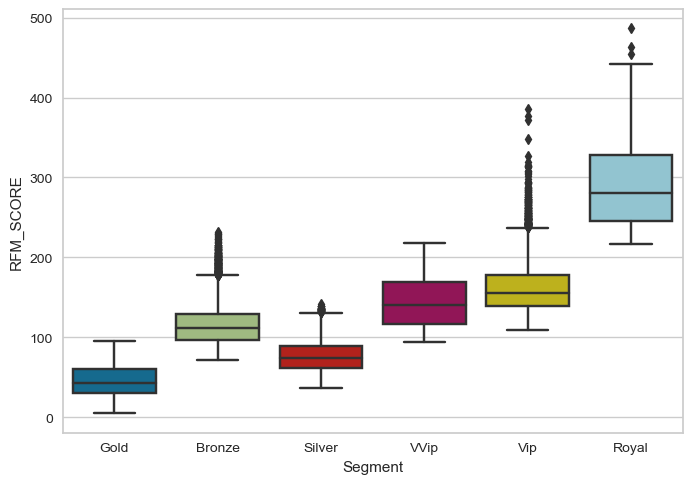

In [104]:
marker0_ind = rfm[rfm['Segment']=='Bronze'].index
marker1_ind = rfm[rfm['Segment']=='Silver'].index
marker2_ind = rfm[rfm['Segment']=='Gold'].index
marker3_ind = rfm[rfm['Segment']=='Royal'].index
marker4_ind = rfm[rfm['Segment']=='Vip'].index
marker4_ind = rfm[rfm['Segment']=='VVip'].index

sns.boxplot(x='Segment', y='RFM_SCORE', data=rfm)
plt.show()

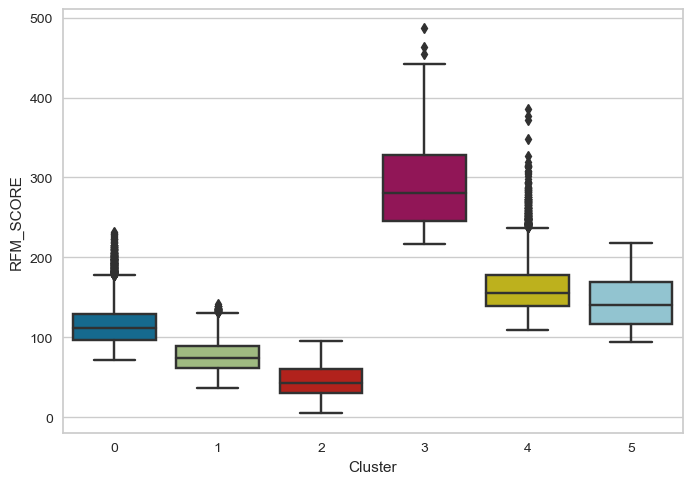

In [103]:
marker0_ind = rfm[rfm['Cluster']==0].index
marker1_ind = rfm[rfm['Cluster']==1].index
marker2_ind = rfm[rfm['Cluster']==2].index
marker3_ind = rfm[rfm['Cluster']==3].index
marker4_ind = rfm[rfm['Cluster']==4].index
marker4_ind = rfm[rfm['Cluster']==5].index

sns.boxplot(x='Cluster', y='RFM_SCORE', data=rfm)
plt.show()

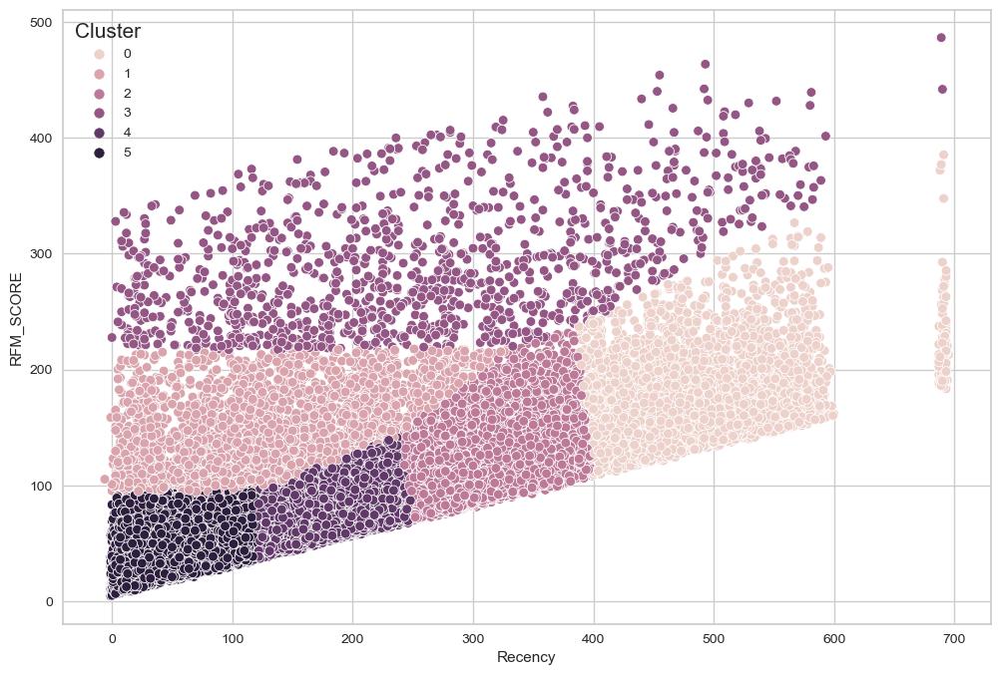

In [161]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Recency', y='RFM_SCORE', data=rfm_pd_merged, hue='Cluster')
plt.show();

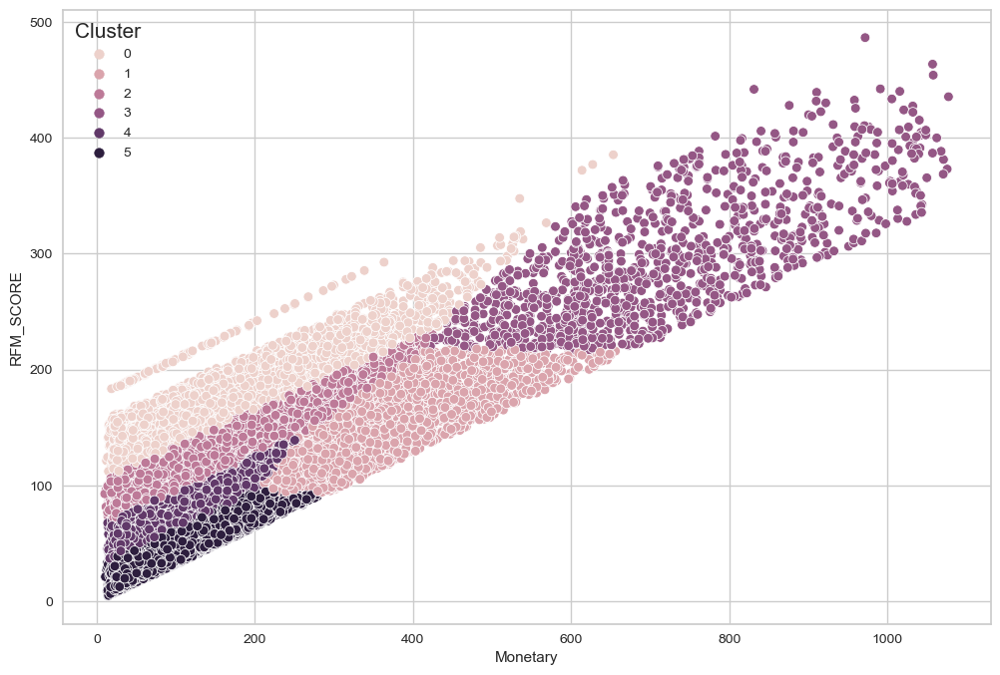

In [162]:
plt.figure(figsize=(12,8))
sns.scatterplot(x='Monetary', y='RFM_SCORE', data=rfm_pd_merged, hue='Cluster')
plt.show();

In [163]:
rfm.sort_values(by='Frequency', ascending=False)

,index,Recency,Frequency,Monetary,recency,frequency,monetary,Cluster,RFM_SCORE,customer_unique_id
21234,21431,8,15,820.15,0.019971,1.000000,0.758971,3,269.912928,8bb00f6a4b2bf731dc04d1af4cfccf1e
15199,15346,61,7,758.83,0.095578,0.428571,0.701520,3,260.508136,636f22218f8430a8463c5ddc5f68fc62
10878,10985,216,6,997.32,0.316690,0.357143,0.924963,3,375.745988,472a149da00ab76966375b76601af3e3
17639,17810,147,5,494.51,0.218260,0.285714,0.453876,1,197.371475,7379b57a7a2b9aa2741a1c564138b99a
11875,11992,75,5,490.41,0.115549,0.285714,0.450035,1,177.657082,4daa117393e38a804850e13486899605
...,...,...,...,...,...,...,...,...,...,...
13003,13130,333,1,126.22,0.483595,0.000000,0.108822,2,125.801035,54f4544f28cadcb2b350e8c84b260868
13004,13131,28,1,195.54,0.048502,0.000000,0.173768,5,69.927056,54f5194ca570ab0f799418851be2b692
13005,13132,439,1,75.03,0.634807,0.000000,0.060862,0,136.579847,54f53965480837781ce5908fa0f47a79
13006,13133,0,1,260.50,0.008559,0.000000,0.234630,5,83.479615,54fa5bd3c92ef6ed4857894049443b20


In [164]:
rfm['Frequency'].value_counts()

1     37286
2      1082
3        68
4         7
5         3
6         1
7         1
15        1
Name: Frequency, dtype: int64

In [105]:
# Function to visualize clusters
def rfm_clusters_stat(df):
    df_new = df.groupby(['Cluster']).agg({
            'RFM_SCORE' : ['mean','median', 'min', 'max', 'count'],
            'Recency'  : ['mean','median', 'min', 'max'],
            'Frequency': ['mean','median', 'min', 'max'],
            'Monetary' : ['mean','median', 'min', 'max', 'count']
        }).round(0)

    return df_new

In [106]:
# Function to visualize clusters
def rfm_clusters_stat(df):
    df_new = df.groupby(['Segment']).agg({
            'RFM_SCORE' : ['mean','median', 'min', 'max', 'count'],
            'Recency'  : ['mean','median', 'min', 'max'],
            'Frequency': ['mean','median', 'min', 'max'],
            'Monetary' : ['mean','median', 'min', 'max', 'count']
        }).round(0)

    return df_new

In [107]:
rfm1= rfm.copy()
rfm1

,index,Recency,Frequency,Monetary,recency,frequency,monetary,Cluster,Segment,RFM_SCORE,customer_unique_id
0,0,110,1,141.90,0.165478,0.0,0.123513,2,Gold,73.777721,0000366f3b9a7992bf8c76cfdf3221e2
1,1,113,1,27.19,0.169757,0.0,0.016040,2,Gold,37.976952,0000b849f77a49e4a4ce2b2a4ca5be3f
2,2,287,1,196.89,0.417974,0.0,0.175033,0,Bronze,136.550101,0004aac84e0df4da2b147fca70cf8255
3,3,145,1,166.98,0.215407,0.0,0.147010,1,Silver,90.719056,0004bd2a26a76fe21f786e4fbd80607f
4,4,130,1,35.38,0.194009,0.0,0.023713,1,Silver,44.933109,00050ab1314c0e55a6ca13cf7181fecf
...,...,...,...,...,...,...,...,...,...,...,...
38444,38812,516,1,32.42,0.744650,0.0,0.020940,4,Vip,142.653959,fd85a7641130055820c8a06a919729e0
38445,38813,32,1,35.36,0.054208,0.0,0.023694,2,Gold,19.877211,fd8abe602ce8ebd7a043782261cb6cda
38446,38814,63,1,89.19,0.098431,0.0,0.074128,2,Gold,44.961125,fd8ae395b4b313a4af523a90a92d6c10
38447,38815,361,1,55.00,0.523538,0.0,0.042095,0,Bronze,110.232935,fd8cb1bbbf12eb443bc2876331db7cc1


In [108]:
rfm_clusters_stat(rfm1).style.background_gradient(cmap='YlGnBu')

- 빈도 기능은 대부분의 고객이 평균적으로 한 번만 주문했기 때문에 모델에 많이 추가되지 않음.
- 대부분의 고객은 한동안 주문하지 않음.

In [109]:
RFM_stats_rfm1 = pd.DataFrame(rfm_clusters_stat(rfm1))
RFM_stats_rfm1

RFM_SCORE                             Recency                   \
             mean median    min    max  count    mean median  min  max   
Segment                                                                  
Bronze      116.0  111.0   72.0  232.0   8724   312.0  305.0  241  399   
Gold         46.0   43.0    5.0   95.0  10013    58.0   56.0   -1  120   
Royal       291.0  280.0  217.0  486.0   1117   256.0  251.0    0  690   
Silver       77.0   74.0   37.0  141.0   9600   182.0  182.0  120  252   
VVip        145.0  140.0   94.0  218.0   2836   134.0  130.0   -6  328   
Vip         163.0  156.0  109.0  385.0   6159   480.0  470.0  388  695   

        Frequency                Monetary                               
             mean median min max     mean median    min     max  count  
Segment                                                                 
Bronze        1.0    1.0   1   3    112.0   91.0   10.0   425.0   8724  
Gold          1.0    1.0   1   3     97.0   85.0   11.0   279.0  10013  
Royal         1.0    1.0   1  15    705.0  680.0  422.0  1077.0   1117  
Silver        1.0    1.0   1   3     94.0   83.0   13.0   252.0   9600  
VVip          1.0    1.0   1   5    345.0  328.0  204.0   656.0   2836  
Vip           1.0    1.0   1   3    125.0   97.0   12.0   653.0   6159

### segmentation 2번째 방법 'rfm_score' 기준

Text(0.5, 0.98, 'Segments of Customers')

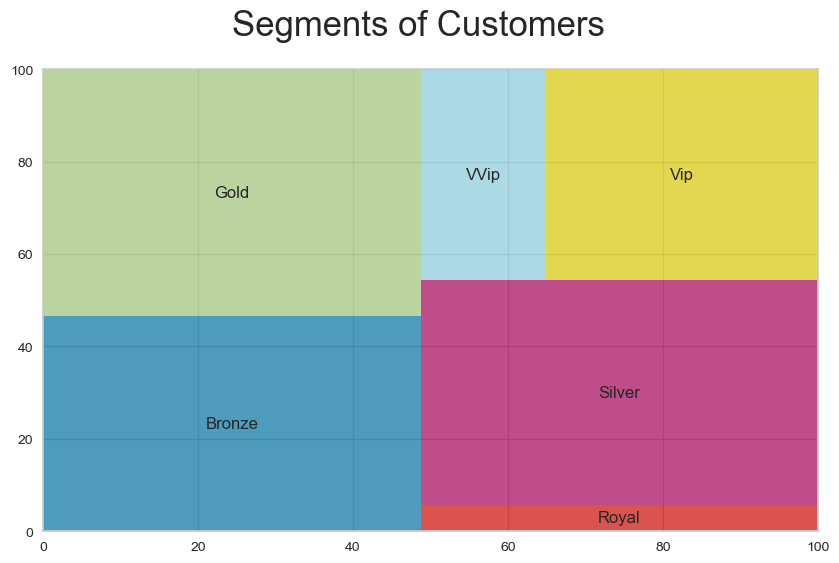

In [110]:
# Visualize Segments
plt.figure(figsize=(10, 6))
squarify.plot(sizes=RFM_stats_rfm1["RFM_SCORE"]["count"], label=RFM_stats_rfm1.index, color=["b","g","r","m","c", "y"], alpha=0.7)
plt.suptitle("Segments of Customers", fontsize=25)